In [14]:
import os
import pandas as pd
import numpy as np
import cv2
from tqdm import tqdm  # For progress bar
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

In [2]:
# Upload your Excel file
from google.colab import files
uploaded = files.upload()  # Choose your Book9.xlsx file

Saving Project_Review_File.xlsx to Project_Review_File.xlsx


In [5]:
os.makedirs('images', exist_ok=True)

In [6]:
# Move uploaded images to the 'images' directory
uploaded_files = os.listdir()  # List all files in the current directory
for file in uploaded_files:
    if file.endswith(('.jpeg', '.jpg','.png')):  # Adjust extensions if needed
        os.rename(file, os.path.join('images', file))

In [7]:
# Load the dataset from the Excel file
data = pd.read_excel('Project_Review_File.xlsx')

# Check the first few rows of the dataset
print(data.head())


                        Image  Recylable?
0  /content/images/Bottle1.png        Yes
1  /content/images/Bottle2.png        Yes
2  /content/images/Bottle3.png        Yes
3  /content/images/Bottle4.png        Yes
4  /content/images/Bottle5.png        Yes


In [8]:
# Preprocess image paths and labels
X = data['Image '].values  # Column with image file names
y = data['Recylable?'].map({'yes': 1, 'no': 0}).values  # Convert 'yes'/'no' to 1/0


In [9]:
# Image data generator for augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20,
                                    width_shift_range=0.2, height_shift_range=0.2,
                                    shear_range=0.2, zoom_range=0.2,
                                    horizontal_flip=True, fill_mode='nearest')

# Create a data generator for training
train_generator = train_datagen.flow_from_dataframe(
    dataframe=data,
    directory='/content/images',  # Use the created images directory
    x_col='Image ',
    y_col='Recylable?',
    target_size=(150, 150),  # Adjust size as necessary
    batch_size=20,
    class_mode='binary'
)
print(train_generator.class_indices)
print(train_generator.samples)

Found 69 validated image filenames belonging to 2 classes.
{'No': 0, 'Yes': 1}
69


In [10]:
# Build the CNN model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))  # Binary classification

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [12]:
# Train the model on the entire dataset
model.fit(train_generator, epochs=32, batch_size=60)  # Adjust epochs as needed

Epoch 1/32


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 856ms/step - accuracy: 0.5036 - loss: 0.7081
Epoch 2/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.7657 - loss: 0.4985
Epoch 3/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 693ms/step - accuracy: 0.8394 - loss: 0.3580
Epoch 4/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 693ms/step - accuracy: 0.8295 - loss: 0.5056
Epoch 5/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.8527 - loss: 0.4400   
Epoch 6/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 843ms/step - accuracy: 0.8879 - loss: 0.2752
Epoch 7/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 685ms/step - accuracy: 0.8962 - loss: 0.2429
Epoch 8/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9508 - loss: 0.1709
Epoch 9/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 691ms/step - accuracy: 0.9774 - loss: 0.0931
Epoch 10/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 692ms/step - accuracy: 0.8828 - loss: 0.2268
Epoch 11/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 894ms/step - accuracy: 0.9276 - loss: 0.1951
Epoch 12/32
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 680ms/step - accuracy: 0.9909 - loss: 0.0772
Epoch 

Found 69 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step


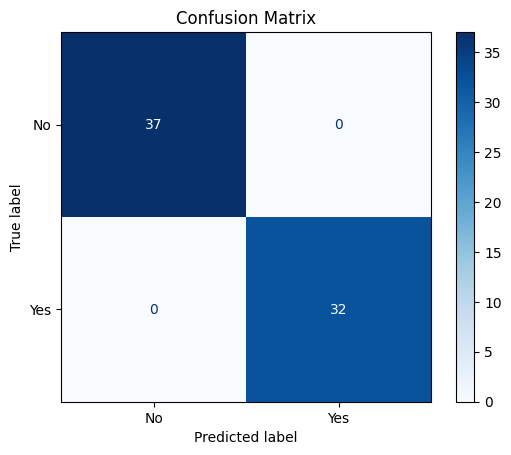

In [15]:
# Validation data generator
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
val_datagen = ImageDataGenerator(rescale=1./255)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=data,
    directory='/content/images',
    x_col='Image ',
    y_col='Recylable?',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    shuffle=False
)

# Make predictions
predictions = model.predict(val_generator)
predicted_classes = (predictions > 0.5).astype(int).flatten()

# Get true labels
true_classes = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


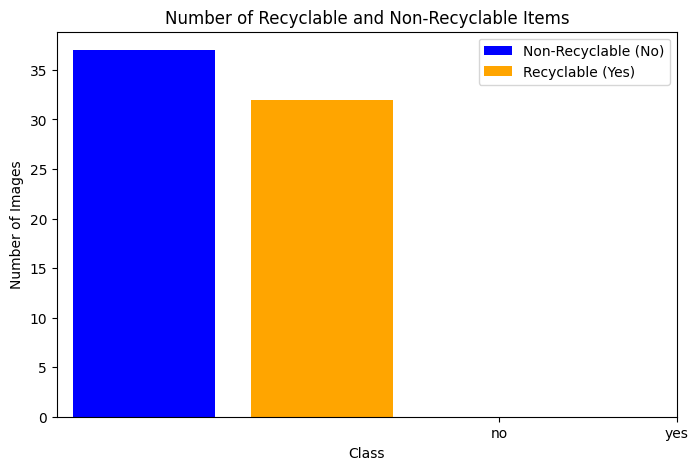

In [18]:
import matplotlib.pyplot as plt

# Count occurrences of each class
class_counts = data['Recylable?'].value_counts()

# Plot the bar chart
plt.figure(figsize=(8, 5))
bars=plt.bar(class_counts.index, class_counts.values, color=['blue', 'orange'])
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Number of Recyclable and Non-Recyclable Items')
plt.xticks(['no', 'yes'])  # Rename x-ticks for clarity
plt.legend([bars[0], bars[1]], ['Non-Recyclable (No)', 'Recyclable (Yes)'], loc='upper right')
plt.show()



In [ ]:
# Save the trained model
model.save('classifying_model.h5')

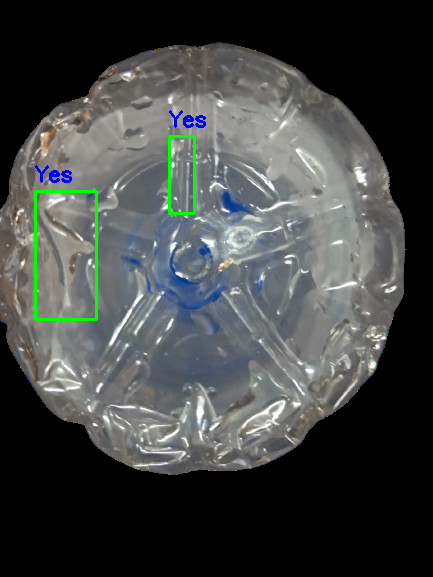

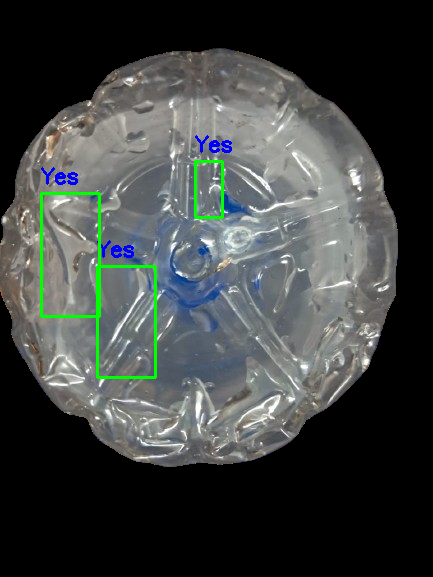

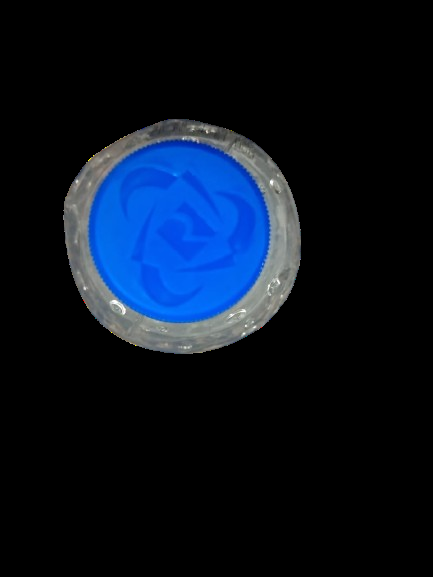

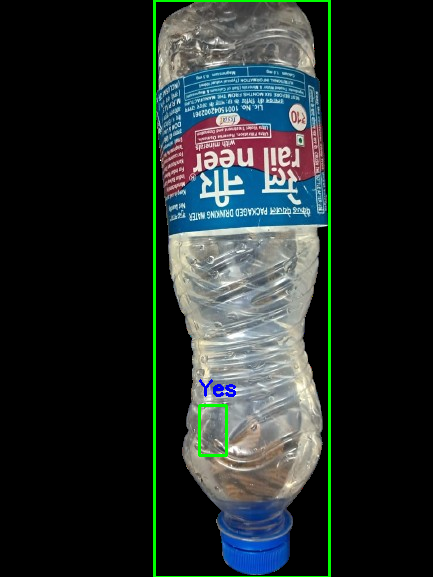

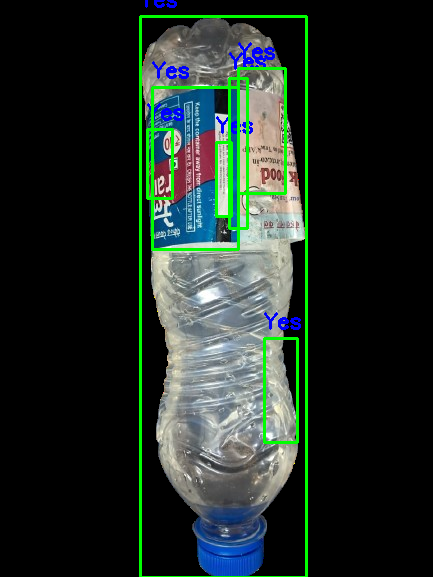

...

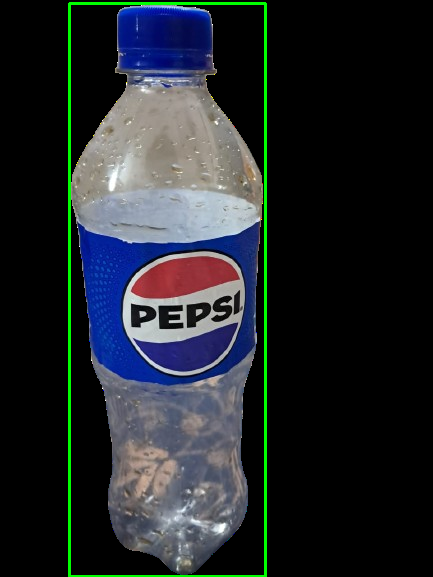

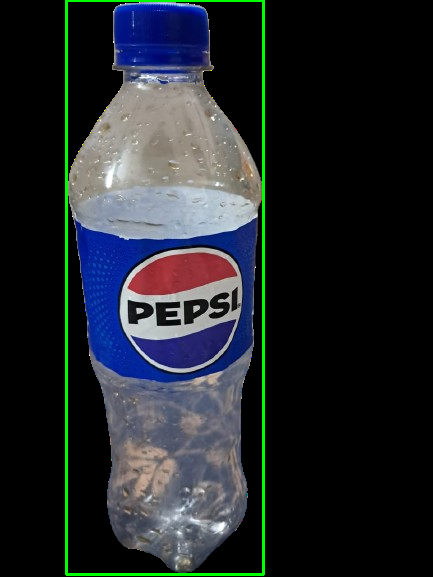

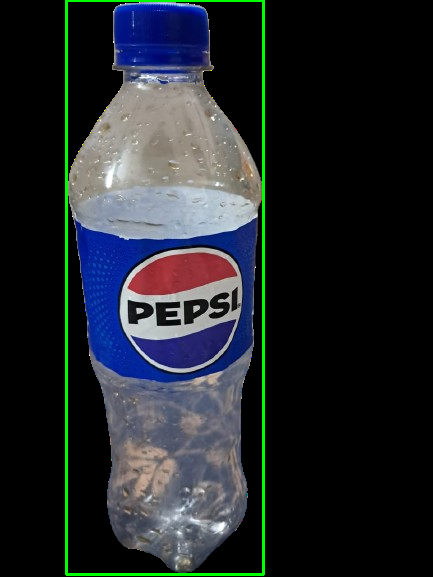

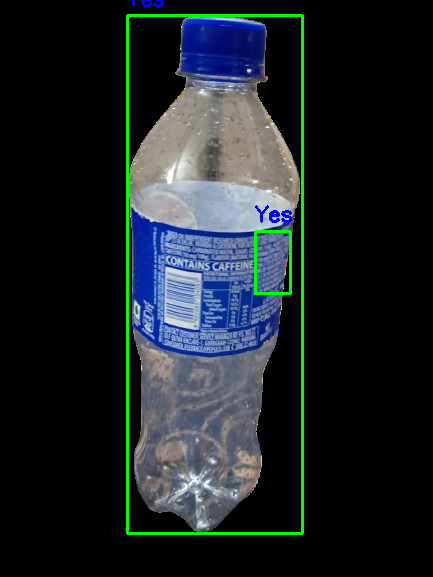

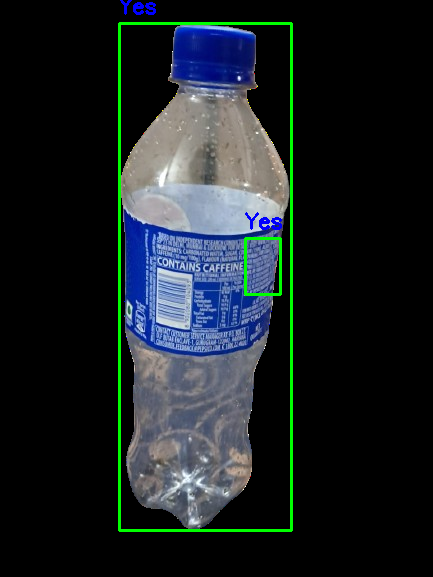

In [20]:
from google.colab.patches import cv2_imshow
import cv2
import pandas as pd
import numpy as np

# Load the Excel file
excel_path = 'Project_Review_File.xlsx'  # Change this to your Excel file path
df = pd.read_excel(excel_path)

# Function to detect objects based on color and shape
def detect_object(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color ranges
    lays_color_lower = np.array([20, 100, 100])
    lays_color_upper = np.array([30, 255, 255])

    kurkure_color_lower = np.array([10, 100, 100])
    kurkure_color_upper = np.array([25, 255, 255])

    # Create masks for Lay's and Kurkure
    lays_mask = cv2.inRange(hsv, lays_color_lower, lays_color_upper)
    kurkure_mask = cv2.inRange(hsv, kurkure_color_lower, kurkure_color_upper)

    # Combine masks
    combined_mask = cv2.bitwise_or(lays_mask, kurkure_mask)

    # Find contours in the combined mask
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    detected_objects = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 500:  # Area threshold for Lay's and Kurkure
            x, y, w, h = cv2.boundingRect(contour)
            detected_objects.append((x, y, w, h))

    # Detect plastic bottles based on shape
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use Canny edge detection to find edges in the image
    edges = cv2.Canny(blurred, 50, 150)

    # Dilate the edges to enhance the contours
    dilated_edges = cv2.dilate(edges, None, iterations=1)

    # Find contours in the edges
    bottle_contours, _ = cv2.findContours(dilated_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    for contour in bottle_contours:
        area = cv2.contourArea(contour)
        if area > 500:  # Adjust the area threshold as necessary
            # Get bounding box and aspect ratio
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = h / float(w)

            # Define criteria for identifying a plastic bottle shape
            if aspect_ratio > 1.5:  # Height should be greater than width
                detected_objects.append((x, y, w, h))

    return detected_objects

# Process each image in the DataFrame
for index, row in df.iterrows():
    image_path = row['Image ']
    recyclable_label = row['Recylable?']

    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image not found: {image_path}")
        continue

    # Detect objects
    detected_objects = detect_object(image)

    # Draw bounding boxes and labels
    for (x, y, w, h) in detected_objects:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(image, recyclable_label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

    # Display the result
    cv2_imshow(image)
    cv2.waitKey(0)

cv2.destroyAllWindows()



In [21]:
# Save the trained model
model.save('classifying_model.h5')